# Semi-automated approaches for interrogating spatial heterogeneity of tissue samples
This notebook is designed to reproduce the main Figures of the manuscript.

In [1]:
from skimage.util import montage
import matplotlib.pyplot as plt
from natsort import natsorted
from anndata import AnnData
import seaborn as sns
import squidpy as sq
import pandas as pd
import scanpy as sc
import numpy as np
import tifffile
import anndata
import zipfile
import copy
import os

# Import helper functions
from utils.utils import *

# Disable warnings
import warnings
warnings.filterwarnings('ignore')

# Disable auto-scrolling
from IPython.display import display, HTML
display(HTML("<style>div.output_scroll { height: auto; max-height: none; }</style>"))

# Data cleaning

### Locate the data

In [2]:
# Path to csv file with single-cell data
file_path ='data/single_cell_dataset.csv'
# Path to image
img_path = r'data/TMA_downstream_analysis.ome.tiff'
# Specify pixel size
px_size = 0.23
# Unzip adata files
for filename in os.listdir( 'data/'):
    if filename.endswith('.zip'):
        with zipfile.ZipFile(os.path.join('data/', filename), 'r') as zip_ref:
            zip_ref.extractall('data/')

In [3]:
# Read the data into a dataframe
data_raw = pd.read_csv(file_path, delimiter = "\t",header=0)
# Randomly shuffle the data frame to make sure all spatial relationships are removed
data = data_raw.sample(frac=1, random_state=42).reset_index(drop=True)

#### Perform Leiden clustering and UMAP
The results of unsupervised clustering an dimensionality reduction using the provided version of scanpy dependency and its sub-dependencies are known to be computer dependent: https://github.com/scverse/scanpy/issues/2014

<br> We provide the unsupervised clustering results that we obtained as a separate AnnData file.
<br> If unsupervised clustring and UMAP is performed using RAW data data, the final results are expected to be different and clsuter names need to be adjusted.

In [4]:
try:
    adata_non_subtracted= anndata.read('data/adata_non_substracted.h5ad')
except FileNotFoundError:
    print('No adata_non_subtracted.h5ad file was found. New adata_non_subtracted will be created')
    print('Leiden clustering and UMAP will be performed locally. Results are likely to be different from original manuscript')
    # Get columns for analysis and normalize them
    data_non_subtracted_norm = normalize_median(data.iloc[:, 10:32].to_numpy())
    #Create an AnnData object
    adata_non_subtracted = AnnData(data_non_subtracted_norm,
                                 obsm={"spatial": data[['Centroid X µm', 'Centroid Y µm']].to_numpy()},
                                 obs = {"cores": data['Core'].to_numpy(),
                                        "type": data['Tumor type'].to_numpy()})
    # Change marker names
    adata_non_subtracted.var_names = ['FoxP3','CD68','aSMA','CD31','CD38','IDO1','s100','CD11c','PDL1','Ki67','CD8','PD1','CD4',
                                    'PanCK','CD3','CD20','CD16','HLADR','Vimentin','CD45','Cy5','TRITC']
    
    # Compute neighborhoods
    sc.pp.neighbors(adata_non_subtracted, n_neighbors = 40)
    # Perform leiden clustering
    sc.tl.leiden(adata_non_subtracted, resolution = 1, key_added="RES=1")
    # Perform umap dimensionality reduction
    sc.tl.umap(adata_non_subtracted, min_dist = 0.5)

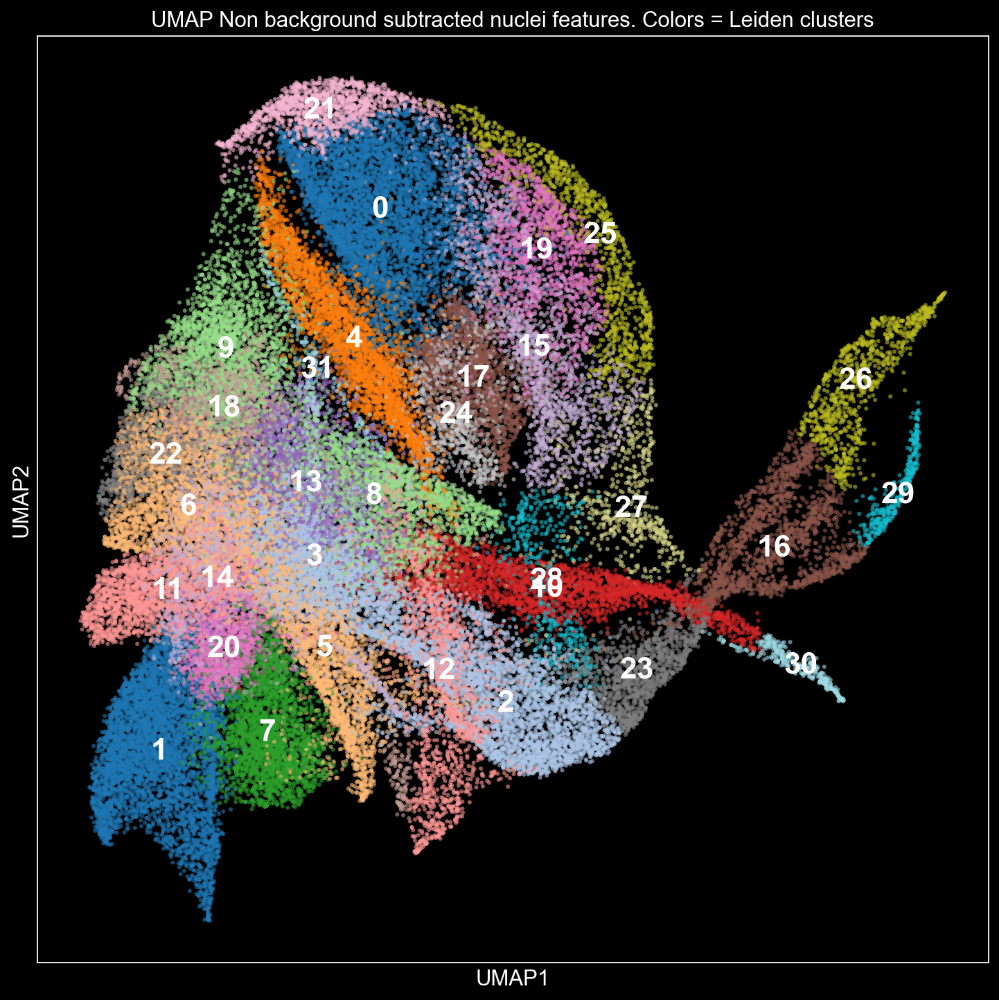

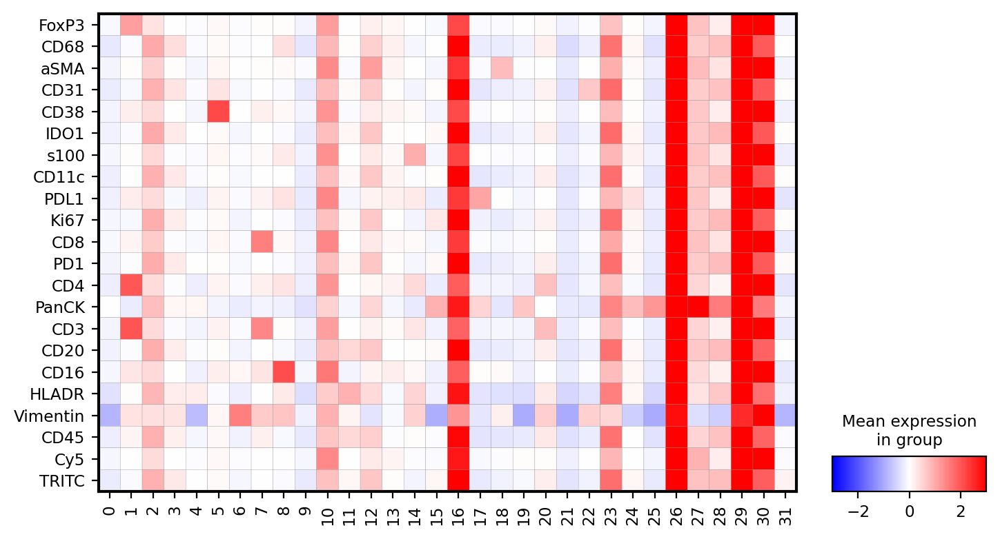

In [5]:
# Plot clustering results in UMAP coordinates
sc.set_figure_params(figsize='11,11')
plt.style.use('dark_background')
sc.pl.umap(adata_non_subtracted, color="RES=1", title = 'UMAP Non background subtracted nuclei features. Colors = Leiden clusters',  palette = 'tab20', size = 30, alpha =  0.6, legend_fontsize = 20, legend_loc = "on data")

# Plot expression matrix
plt.style.use('default')
sc.pl.matrixplot(adata_non_subtracted, var_names = adata_non_subtracted.var_names,groupby = 'RES=1',swap_axes = True, figsize = (8.3,4.5), cmap = 'bwr',  vmin = -3, vmax = 3)

#### Identify clusters with expression over all channels
As discussed in the paper 4 clusters with the highest expression per all markers were identified as mainly composed of erythrocytes.

In [6]:
cluster_names = adata_non_subtracted.obs['RES=1'].astype(int)
data_non_subtracted_norm = adata_non_subtracted.X
# Sort clusters based on expression per all markers
sorted_unique_clusters, _ = get_sorted_clusters(cluster_names, data_non_subtracted_norm)
# Take 4 clusters with the highest expression per all markers
err_cluster_names = sorted_unique_clusters[0:4]
# Print clusters of interest
print(f'Identified FP clusters {err_cluster_names}')
# Create a binary mask of erythrocytes
bin_mask_erythrocytes= cluster_names.isin(err_cluster_names).values
# Get the indices of erythrocytes
indxs_of_erythrocytes = np.array([i for i, value in enumerate(cluster_names) if value in err_cluster_names], dtype = int)

Identified FP clusters [26 29 30 16]


#### Exclude nuclei based on percentile values of:  

* Detection probability > 0.05 percentile
* DAPI signal mean intensity > 0.05 percentile
* 0.05 percentile < Nucleus area < 0.999
* Nucleus circularity > 0.05 percentile

<br> The idea is to exclude the nuclei detections that have low detection probability, are dim, small or very big and non circular.

In [7]:
# Get columns of interest
prob = data['Detection probability'].to_numpy()
DAPI_mean = data['DAPI: Nucleus: Mean'].to_numpy()
area = data['Nucleus: Area µm^2'].to_numpy()
circ = data['Nucleus: Circularity'].to_numpy()

# Define left (q1) and right (q2) percentiles
q1 = 0.05; q2 = 0.999

# Create masks for each condition. Exclude erythrocytes from percentile computation
mask_prob = prob > np.nanquantile(prob[~bin_mask_erythrocytes], q1)
mask_mean = DAPI_mean > np.nanquantile(DAPI_mean[~bin_mask_erythrocytes], q1)
mask_area_smaller = area < np.nanquantile(area[~bin_mask_erythrocytes], q2)
mask_area_larger = area > np.nanquantile(area[~bin_mask_erythrocytes], q1)
mask_circ = circ > np.nanquantile(circ[~bin_mask_erythrocytes], q1)

# Return bitwise AND mask
gating_mask = mask_prob & mask_mean & mask_area_smaller & mask_area_larger & mask_circ
gating_indxs = np.where(gating_mask == 0)[0]

#### Get original indices for further use and summarize the results

In [8]:
# Get real indices from INDEX column
fp_dapi_cell_indxs = data['INDEX'][gating_indxs].to_numpy()
err_cell_indxs= data['INDEX'][indxs_of_erythrocytes].to_numpy()
# Concatenate indxs all excluded objects
excluded_cell_indxs = np.unique(np.concatenate((fp_dapi_cell_indxs, err_cell_indxs)))

# Printing the numbers of cells excluded
print('GATING_Exclusion. Number of cells: ', len(fp_dapi_cell_indxs))
print('ERYTHROCYTE_Exclusion. Number of cells: ', len(err_cell_indxs))
print('Total number of cells excluded: ', len(excluded_cell_indxs))

GATING_Exclusion. Number of cells:  10797
ERYTHROCYTE_Exclusion. Number of cells:  3432
Total number of cells excluded:  13738


#### Plot some examples of both types of FPs if image is available

In [9]:
# Only execute this if image is found:
try:
    # Load a DAPI channel from the .ome.tiff image
    DAPI_img = tifffile.imread(img_path, series=0, level=0, key = 0)
    # Specify parameters of CROPS
    img_size_px = 50
    number_of_crops_per_batch = 1000
    normalize_crop = True

    # Get original nuclei coordinates 
    all_nuclei_coords = np.column_stack((data_raw['Centroid X µm'].to_numpy(), data_raw['Centroid Y µm'].to_numpy()))

    # Get coordinates for fp dapi and gated_dapi cells
    gating_coords = all_nuclei_coords[fp_dapi_cell_indxs[0:number_of_crops_per_batch]]
    err_coords = all_nuclei_coords[err_cell_indxs[0:number_of_crops_per_batch]]

    # Get image crops for clusters identified as erythrocytes
    GATING_imgs = get_img_array(DAPI_img, img_size_px, gating_coords, normalize_crop, px_size)
    CLUSTER_imgs = get_img_array(DAPI_img, img_size_px, err_coords, normalize_crop, px_size)

    # Plot montages
    img_count = 16

    # Make montages
    montage_err = montage(CLUSTER_imgs[0:img_count*img_count])
    montage_gating = montage(GATING_imgs[0:img_count*img_count])

    # Cleanup
    del DAPI_img

    # Get centers
    cntr_y = np.repeat(np.arange(img_size_px/2, montage_err.shape[0],img_size_px), img_count)
    cntr_x = np.tile(np.arange(img_size_px/2, montage_err.shape[0], img_size_px), img_count)

    #Plot montages
    fig, ax = plt.subplots(figsize=(15, 15))
    plt.title('Nuclei from excluded clusters (256 random examples)')
    plt.scatter(cntr_y, cntr_x, c = 'yellow', s = 10, marker = 'x')
    plt.axis('off')
    plt.imshow(montage_err, cmap = 'gray', vmin = 0, vmax = 50000)
    plt.show()

    fig, ax = plt.subplots(figsize=(15, 15))
    plt.title('Nuclei excluded by gating (256 random examples)')
    plt.scatter(cntr_y, cntr_x, c = 'yellow', s = 10, marker = 'x')
    plt.axis('off')
    plt.imshow(montage_gating, cmap = 'gray', vmin = 0, vmax = 50000)
    plt.show()
except FileNotFoundError:
    print(f'Image in a specified path {img_path} was not found. Skipping this cell')

Image in a specified path data/TMA_downstream_analysis.ome.tiff was not found. Skipping this cell


# Prepare data for phenotyping

In [10]:
#Filter based on data cleaning steps
data_uns = data_raw[data_raw['INDEX'].isin(excluded_cell_indxs) == False]

#Randomly shuffle the data frame
data_uns = data_uns.sample(frac=1, random_state=42).reset_index(drop=True)

# Get all expression data and perform Z-scaling and winsorize
counts_markers_all = data_uns.iloc[:, 32:].to_numpy()
counts_markers_all_norm = normalize_z_scaling(counts_markers_all)
counts_markers_all_norm = winsorize_column_wise(counts_markers_all_norm, [0, 0.0001])

# Short column names
short_col_names = ['FoxP3','CD68','aSMA','CD31','CD38','IDO1','s100','CD11c','PDL1','Ki67',
                   'CD8','PD1','CD4', 'PanCK','CD3','CD20','CD16','HLADR','Vimentin','CD45']

#Create an AnnData object
adata_phenotyping = AnnData(counts_markers_all_norm,
                             obsm={"spatial": data_uns[['Centroid X µm', 'Centroid Y µm']].to_numpy()},
                             obs = {"cores": data_uns['Core'].to_numpy(),
                                    "type": data_uns['Tumor type'].to_numpy(),
                                    'samples': data_uns['Sample'].to_numpy()})
# Change marker names
adata_phenotyping.var_names = short_col_names

# Specify the names that will be used for core arrangement later
core_names_arranged = ['B1','F1','C2','G2','D3','C1','G1','D2','A3','E3','D1','A2','E2','B3','F3','E1','B2','F2','C3','G3']

# Supervised phenotyping (Figure 3)

### Automatically threshold each marker
2 assumptions are made here:
* The first peak of the histogram to the left is a background signal.
* Background signal is normally distributed.

In [11]:
# Prepare parameters for marker thresholding
histogram_range = (np.min(counts_markers_all_norm), np.max(counts_markers_all_norm)/5)
# In this paper we used 6 sigma threshold, but it can be adjusted based on the data
sigma_multiplier = 6.0
thresholded_marker_table = get_binary_cells(counts_markers_all_norm, histogram_range, sigma_multiplier)

### Perform rule based classification

In [12]:
#
def rule_based_classifier(binary_df):
    """
    This method performs a rule-based classification according to the rules defined in the manuscript.
    
    Parameters:
        binary_df (pandas.Dataframe): Dataframe containing binary marker table
        
    Returns:
        numpy.ndarray: Integer numbers are corresponding to the assigned classes
    """
    # Create an empty list
    rule_classifier = [[] for i in range(len(binary_df))]
    
    for index, cell in binary_df.iterrows():
        if cell['PanCK']:
            if cell['PDL1']:
                rule_classifier[index].append(1 if cell['Ki67'] else 2)
            else:
                rule_classifier[index].append(3 if cell['Ki67'] else 4)
        else:
            if cell['CD45']:
                if cell['CD3']:
                    if cell['CD4']:
                        rule_classifier[index].append(7 if cell['FoxP3'] else 8)
                    else:
                        rule_classifier[index].append(5 if cell['CD8'] else 6)
                else:
                    if cell['CD68']:
                        rule_classifier[index].append(9 if cell['CD16'] else (11 if cell['CD11c'] else 10))
                    else:
                        rule_classifier[index].append(12 if cell['HLADR'] and cell['CD11c'] else 13)
            else:
                rule_classifier[index].append(14 if cell['aSMA'] else (15 if cell['CD31'] else 16))
    return np.asarray(rule_classifier, dtype = int).ravel()

In [13]:
# Make a pandas dataframe
binary_marker_table = pd.DataFrame(thresholded_marker_table, columns = short_col_names)

# Perform tree classification using a sequence of boolean conditions
rule_based_classes_ints = rule_based_classifier(binary_marker_table)

# Create a dictionary for the supervised cell phenotypes
supervised_cluster_names = {
    1: '(00) Immunosuppressive ki67+ tumor cells',
    2: '(01) Immunosuppressive ki67- tumor cells',
    3: '(02) Proliferating tumor cells',
    4: '(03) Non-proliferating tumor cells',
    5: '(04) CD8+ T-cells',
    6: '(05) Double negative T-cells',
    7: '(06) Regulatory T-cells',
    8: '(07) CD4+ cells',
    9: '(08) CD16 macrophages',
    10: '(09) Macrophages',
    11: '(10) CD11c+ macrophages',
    12: '(11) Dendritic cells',
    13: '(12) CD3- immune cells',
    14: '(13) Smooth muscle cells',
    15: '(14) Endothelial cells',
    16: '(15) Unknown cells'}

# Remap the names
rule_based_classes = [supervised_cluster_names.get(value, value) for value in rule_based_classes_ints.astype(int)]

In [14]:
# Copy an AnnData object and write rule based classes to an object
adata_supervised = adata_phenotyping.copy()
adata_supervised.obs['rule_based_class'] = rule_based_classes

Trying to set attribute `.obs` of view, copying.
... storing 'cores' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'samples' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'rule_based_class' as categorical


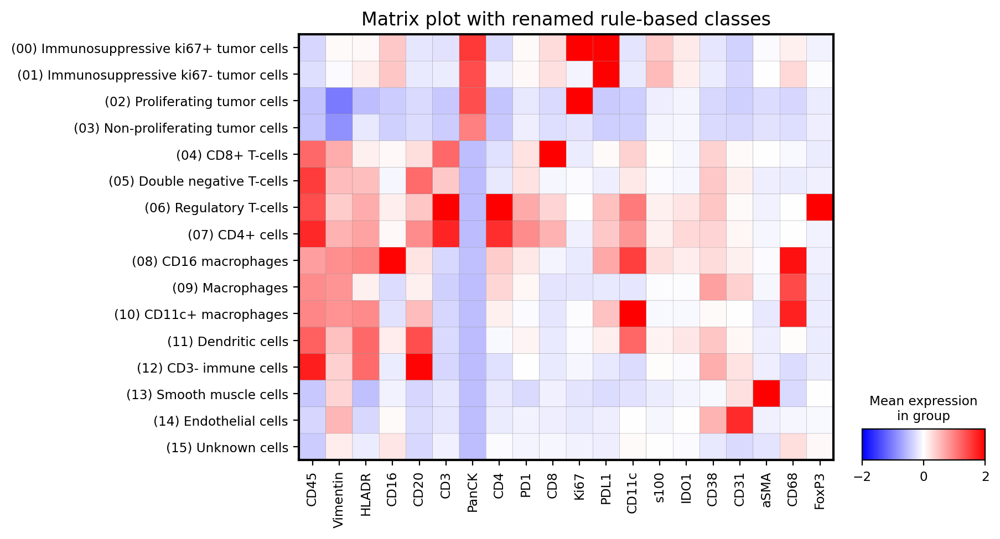

In [15]:
# Plot expression matrix
plt.style.use('default')
matrix_plot_name = 'Matrix plot with renamed rule-based classes'
sc.pl.matrixplot(adata_supervised[::-1], title = matrix_plot_name, var_names = adata_supervised.var_names[::-1],groupby = 'rule_based_class', figsize = (8,5), cmap = 'bwr',  vmin = -2, vmax = 2)

#### Plot distributions per tumor type, per sample and cell count bar plot

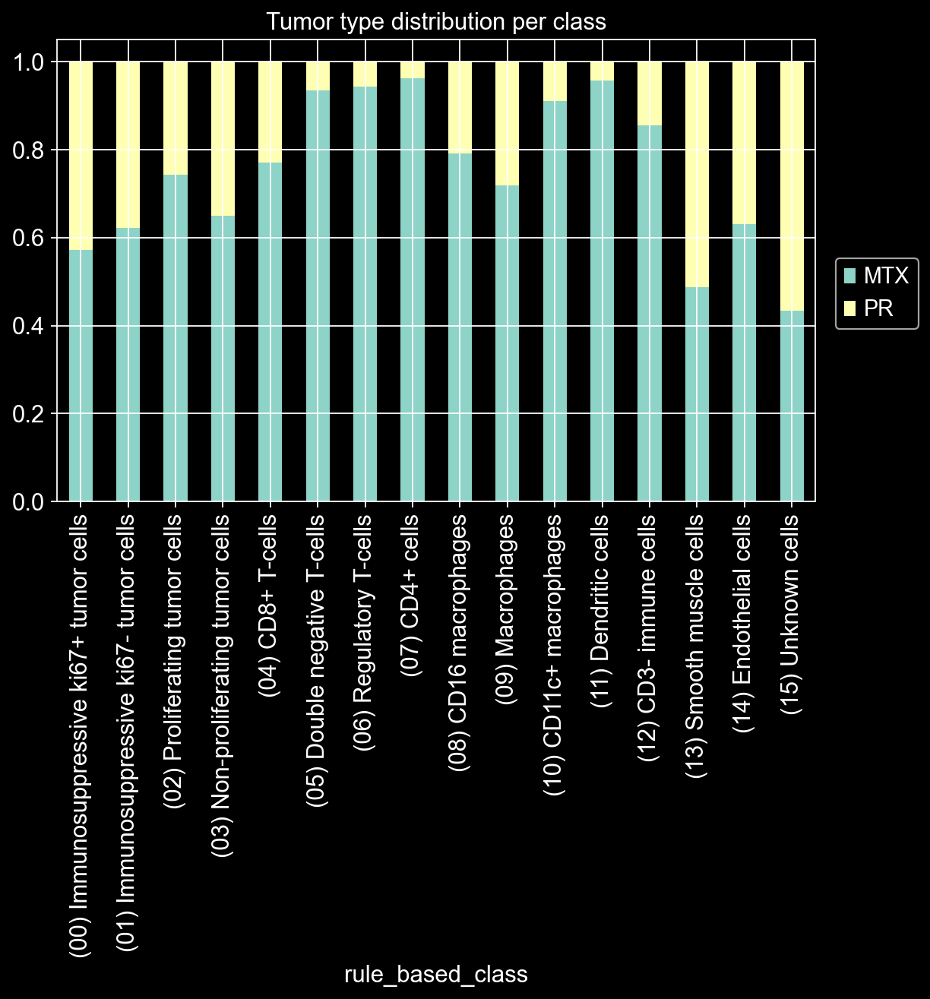

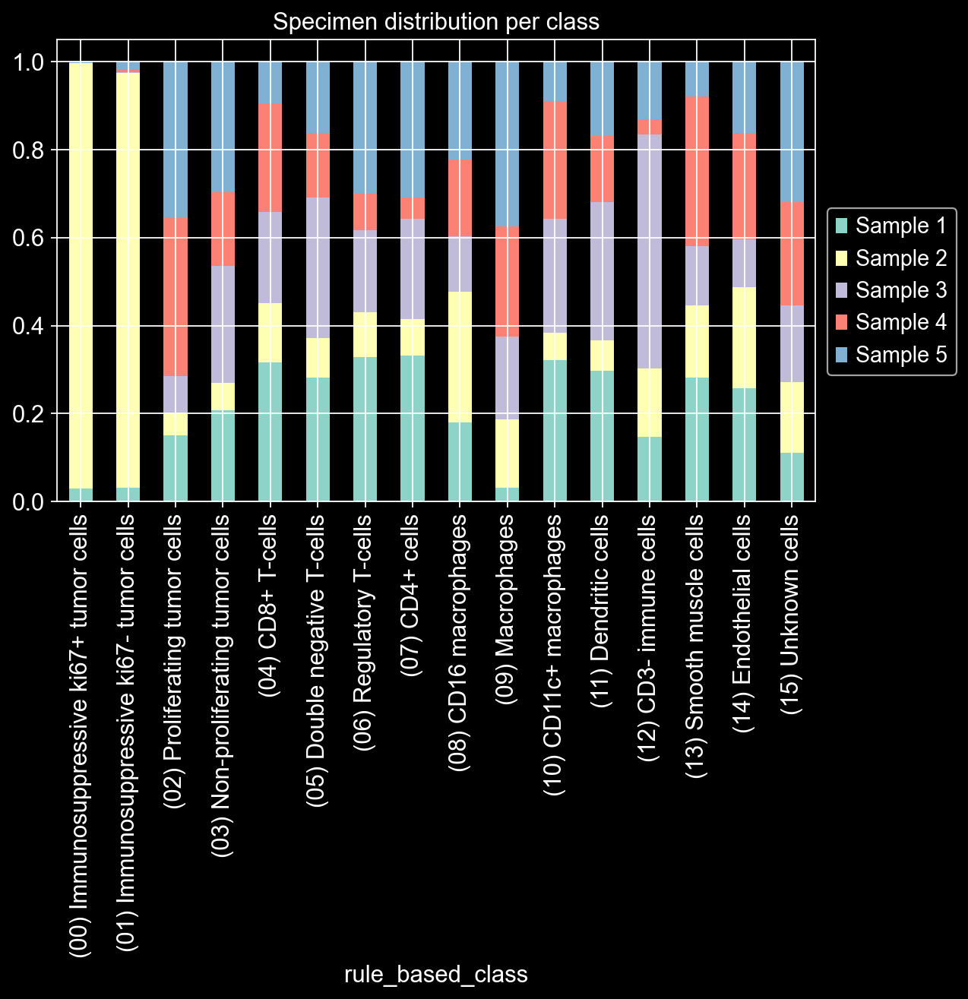

In [16]:
sc.set_figure_params(figsize='8,5')
plt.style.use('dark_background')
title_1 = 'Tumor type distribution per class'
title_2 = 'Specimen distribution per class'
tmp = pd.crosstab(adata_supervised.obs['rule_based_class'],adata_supervised.obs['type'], normalize = 'index') 
tmp.plot.bar(stacked=True, title = title_1).legend(loc='lower right',bbox_to_anchor=(1.15, 0.35))

tmp = pd.crosstab(adata_supervised.obs['rule_based_class'],adata_supervised.obs['samples'], normalize = 'index') 
tmp.plot.bar(stacked=True, title = title_2).legend(loc='lower right',bbox_to_anchor=(1.2, 0.25))

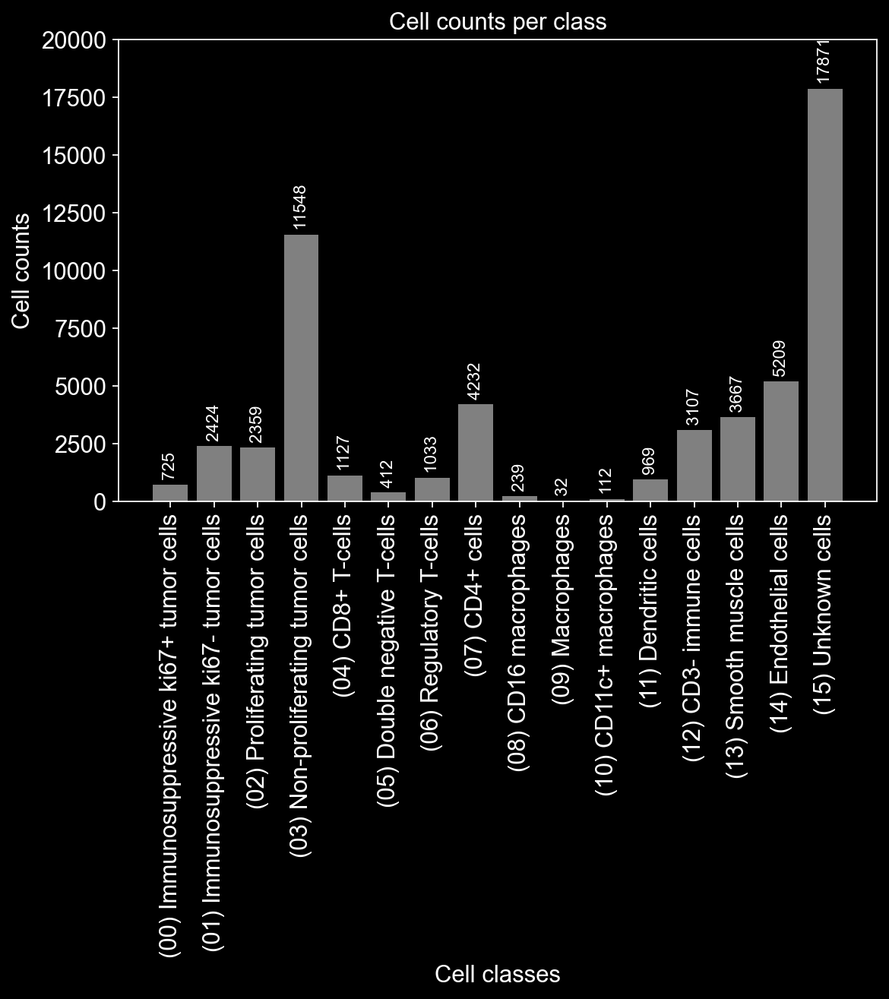

In [17]:
# Create a bar plot for counts
counts = adata_supervised.obs['rule_based_class'].value_counts().sort_index()
# Get data
categories = counts.index.to_numpy()
values = counts.to_numpy()
# Plot bar plot
fig, _ = plot_bar_chart(categories, values)
plt.show()

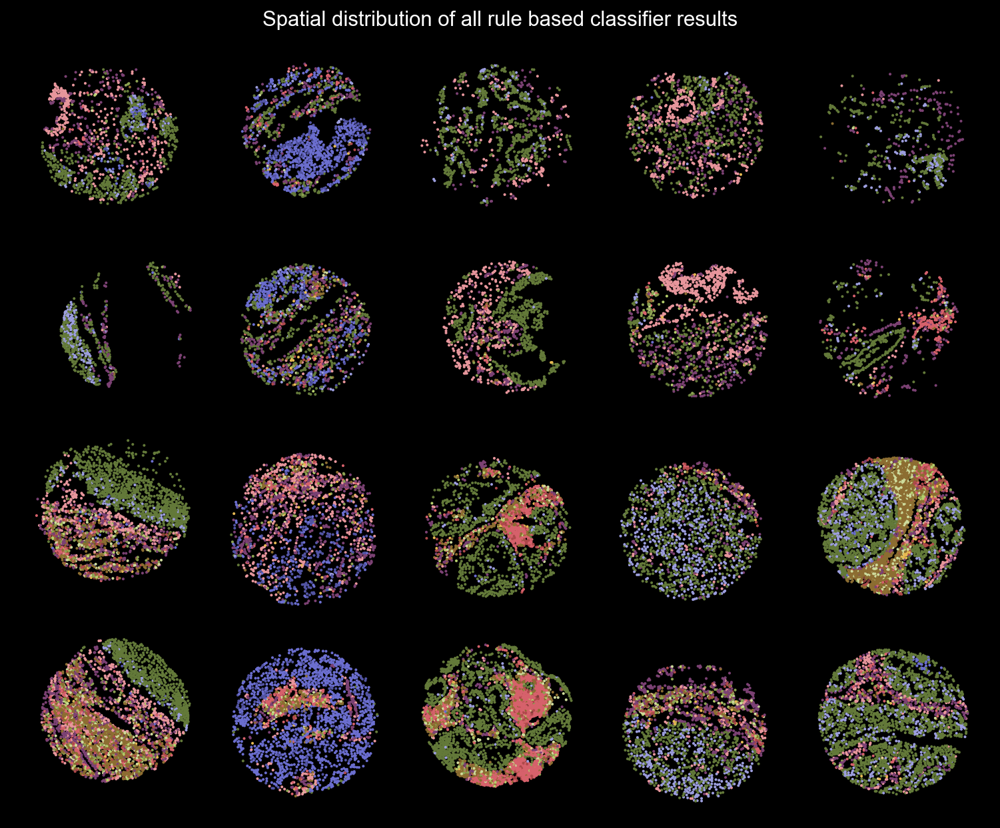

In [18]:
# Get X,Y coords recenter
X_coords, Y_coords = recenter_cores(adata_supervised, core_names_arranged)

# Create mask for unknowns
umask = rule_based_classes_ints != 16

# Create a plot
fig, ax = plt.subplots(figsize = (16,8))

ax.scatter(X_coords[umask], Y_coords[umask], c = rule_based_classes_ints[umask], cmap = 'tab20b', s = 0.7, vmin=0, vmax=18)

ax.set_ylim(500,-3500)
ax.set_xlim(-500,4500)
ax.set_facecolor('white')
ax.set_aspect('equal')
ax.axis('off')
ax.set_title('Spatial distribution of all rule based classifier results')

plt.tight_layout()

# Unsupervised phenotyping (Figure 4)

### Perform Leiden clustering and UMAP on filtered data
The results of unsupervised clustering an dimensionality reduction using the provided version of scanpy dependency and its sub-dependencies are known to be computer dependent: https://github.com/scverse/scanpy/issues/2014

<br> We provide the unsupervised clustering results that we obtained as a separate AnnData file.

<br> If unsupervised clustring and UMAP is performed using RAW data data, the final results are expected to be different and clsuter names need to be adjusted.

<br> In subsequent steps the clusters on PanCK are merged into 1 metacluster and cluster 19 associated with false possitive segmentations is removed as described in the manuscript.

In [19]:
try:
    adata_unsupervised = anndata.read('data/adata_unsupervised.h5ad')
except FileNotFoundError:
    print('Leiden clustering and UMAP will be performed locally. Results are likely to be different from original manuscript ')
    # Create an instance of anndata object
    adata_unsupervised = adata_phenotyping.copy()
    # Compute neighborhoods
    sc.pp.neighbors(adata_unsupervised, n_neighbors = 40)
    # Perform UMAP dimensionality reduction
    sc.tl.umap(adata_unsupervised, min_dist = 0.5)
    # Perform Leiden clustering
    sc.tl.leiden(adata_unsupervised, resolution = 0.8, key_added="RES=0.8")

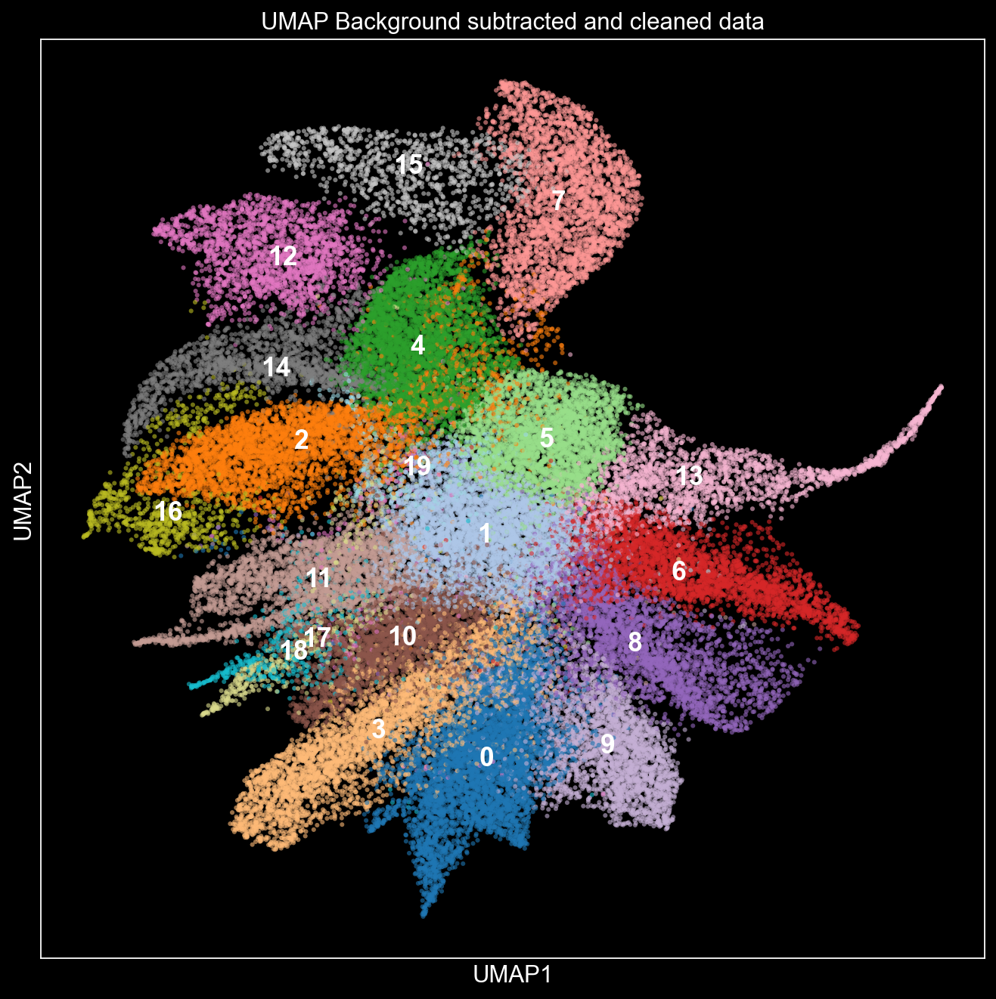

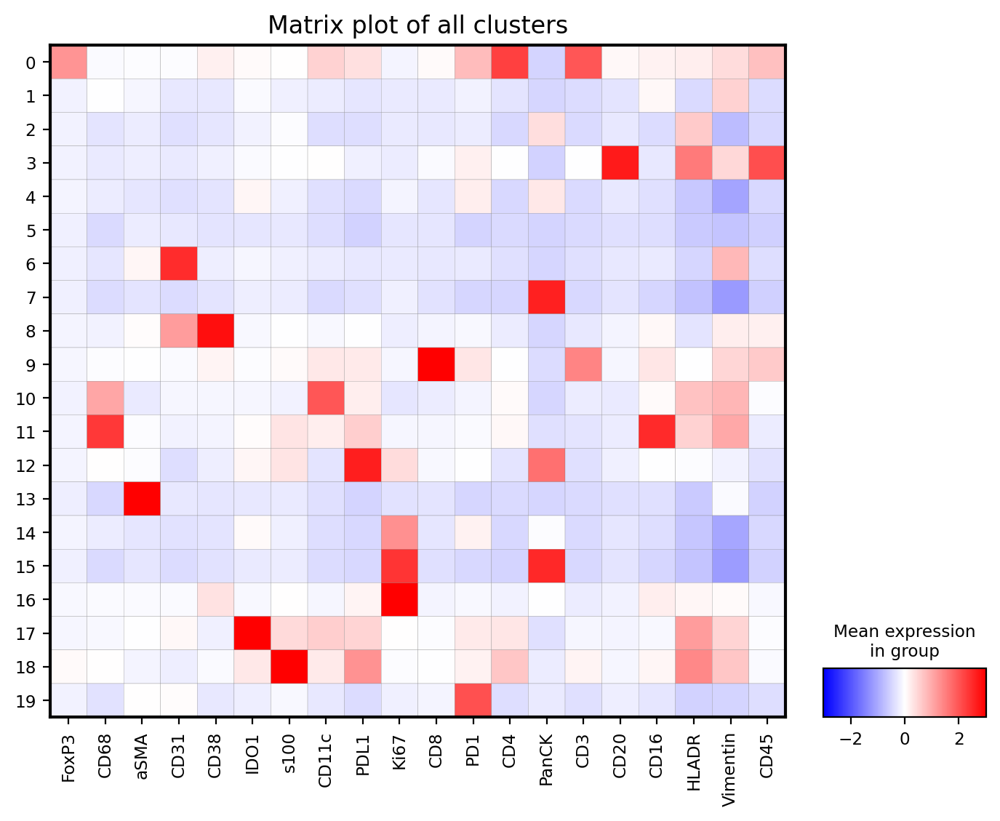

In [20]:
# Plot clustering results in UMAP coordinates
sc.set_figure_params(figsize='10,10')
plt.style.use('dark_background')
plt_name = 'UMAP Background subtracted and cleaned data'
sc.pl.umap(adata_unsupervised, color="RES=0.8",  title = plt_name, palette = 'tab20', size = 30, alpha =  0.6, legend_loc = "on data", legend_fontsize = 16)

# Plot expression matrix
plt.style.use('default')
matrix_plot_name = 'Matrix plot of all clusters'
sc.pl.matrixplot(adata_unsupervised, title = matrix_plot_name, var_names = adata_unsupervised.var_names,groupby = 'RES=0.8', figsize = (8.3,6), cmap = 'bwr',  vmin = -3, vmax = 3)

#### Merge PanCK clusters
Idea here is to merge similar PanCK clusters into one metacluster for further analysis

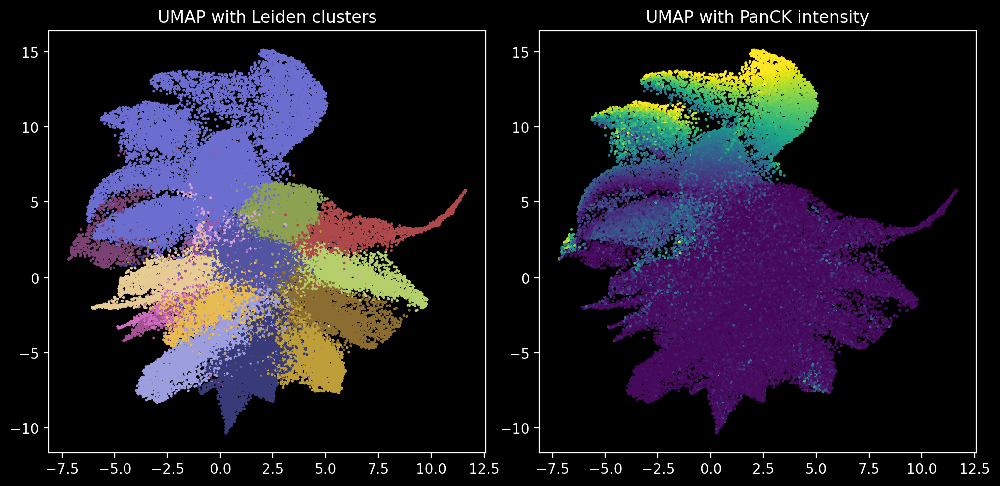

In [21]:
# Visualize UMAP with cluster colors and UMAP with PanCK intensity
clusters = adata_unsupervised.obs_vector('RES=0.8').to_numpy(dtype = 'int')
UMAP_coords = adata_unsupervised.obsm['X_umap']
PancK_intensity = counts_markers_all.T[13]

# Merge Clusters
merged_clusters = merge_clusters(clusters, [2,4,7,12,15,14], 2)

plt.style.use('dark_background')
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.scatter(UMAP_coords[:, 0], UMAP_coords[:, 1], c = merged_clusters, s = 1, cmap = 'tab20b', label = merged_clusters)
ax1.set_title('UMAP with Leiden clusters')
ax2.scatter(UMAP_coords[:, 0], UMAP_coords[:, 1], c = PancK_intensity, s = 1, cmap = 'viridis', vmax = np.quantile(PancK_intensity, 0.99))
ax2.set_facecolor('black')
ax2.set_title('UMAP with PanCK intensity')
plt.tight_layout()

#### Remove cluster 19 and name each cluster with expected phenotype

In [22]:
# Remove cluster 19 and create a new cleaned AnnData object.
# Create a mask for cluster 19
cluster_19_mask = merged_clusters != 19
# Filtered array of cluster names
filt_names = merged_clusters[cluster_19_mask].astype('int')
# Create a filtered AnnData object
adata_unsupervised_cleaned = adata_unsupervised.copy()
adata_unsupervised_cleaned = adata_unsupervised_cleaned[cluster_19_mask, :]
# Store cluster names as str in adata object
adata_unsupervised_cleaned.obs['Filtered clusters'] = filt_names.astype('str')
# Change the names based on the expression patterns
new_cluster_names = {
    0: '(00) Regulatory T cells',
    1: '(01) Fibroblasts',
    2: '(02) Tumor cells',
    3: '(03) Lymphoid B cells',
    5: '(04) Other cells',
    6: '(05) Endothelial cells',
    8: '(06) Stromal cells',
    9: '(07) CD8 T cells',
    10: '(08) CD11c macrophages',
    11: '(09) CD16 macrophages',
    13: '(10) Myoepithelial cells',
    16: '(11) Proliferating cells',
    17: '(12) Myeloid cells',
    18: '(13) Dendritic cells'}
full_names = [new_cluster_names.get(value, value) for value in filt_names]
adata_unsupervised_cleaned.obs['Renamed clusters'] = full_names

Trying to set attribute `.obs` of view, copying.


#### Plot UMAP with Leiden clusters and a matrix plot

... storing 'Filtered clusters' as categorical
... storing 'Renamed clusters' as categorical


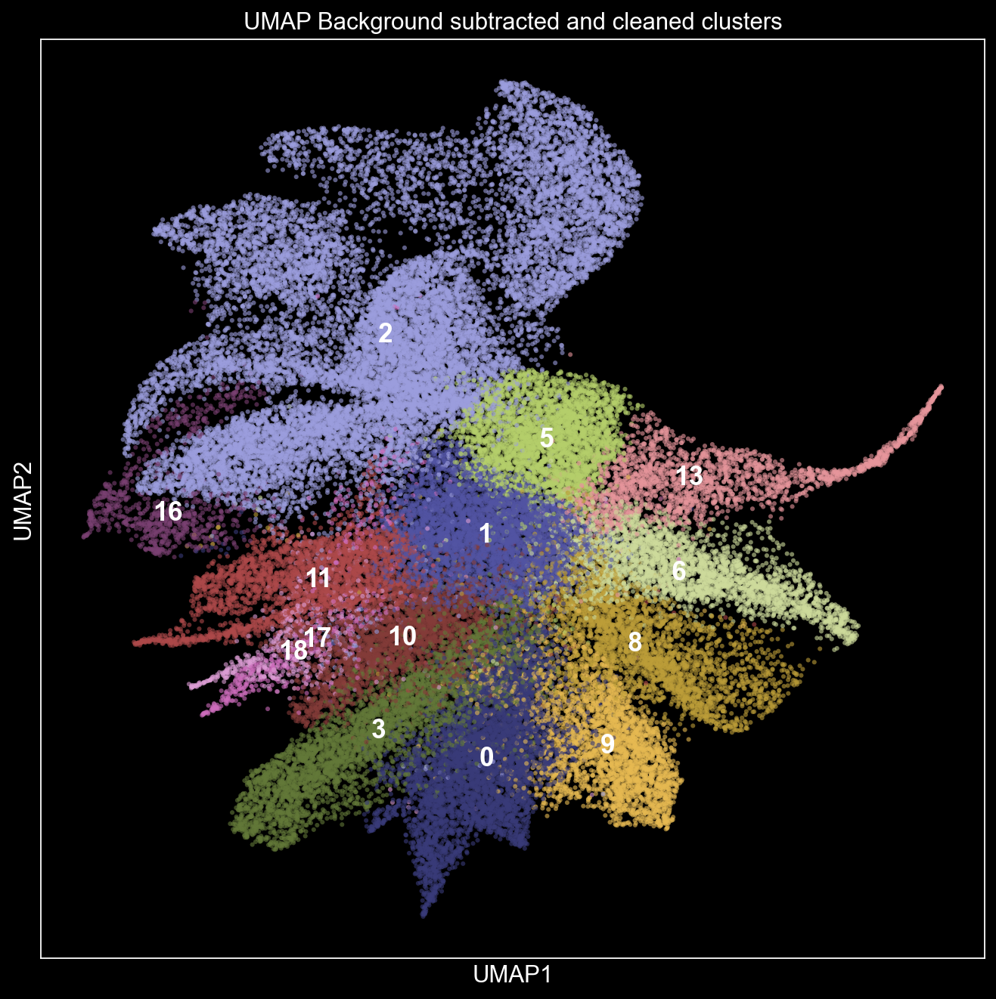

In [23]:
# Plot clustering results in UMAP coordinates
sc.set_figure_params(figsize='10,10')
plt.style.use('dark_background')
plt_name = 'UMAP Background subtracted and cleaned clusters'
sc.pl.umap(adata_unsupervised_cleaned, color="Filtered clusters", title = plt_name, palette = 'tab20b', size = 30, alpha =  0.6, legend_loc = "on data", legend_fontsize = 16)

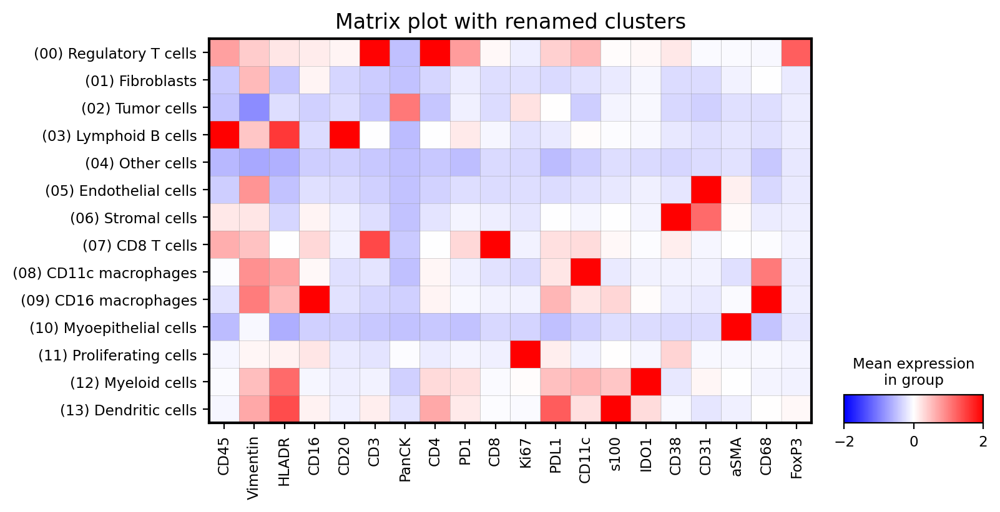

In [24]:
# Plot expression matrix
plt.style.use('default')
matrix_plot_name = 'Matrix plot with renamed clusters'
sc.pl.matrixplot(adata_unsupervised_cleaned[::-1], title = matrix_plot_name, var_names = adata_unsupervised_cleaned.var_names[::-1],groupby = 'Renamed clusters', figsize = (8,4), cmap = 'bwr',  vmin = -2, vmax = 2)

#### Plot distributions per tumor type, per sample and cell count bar plot

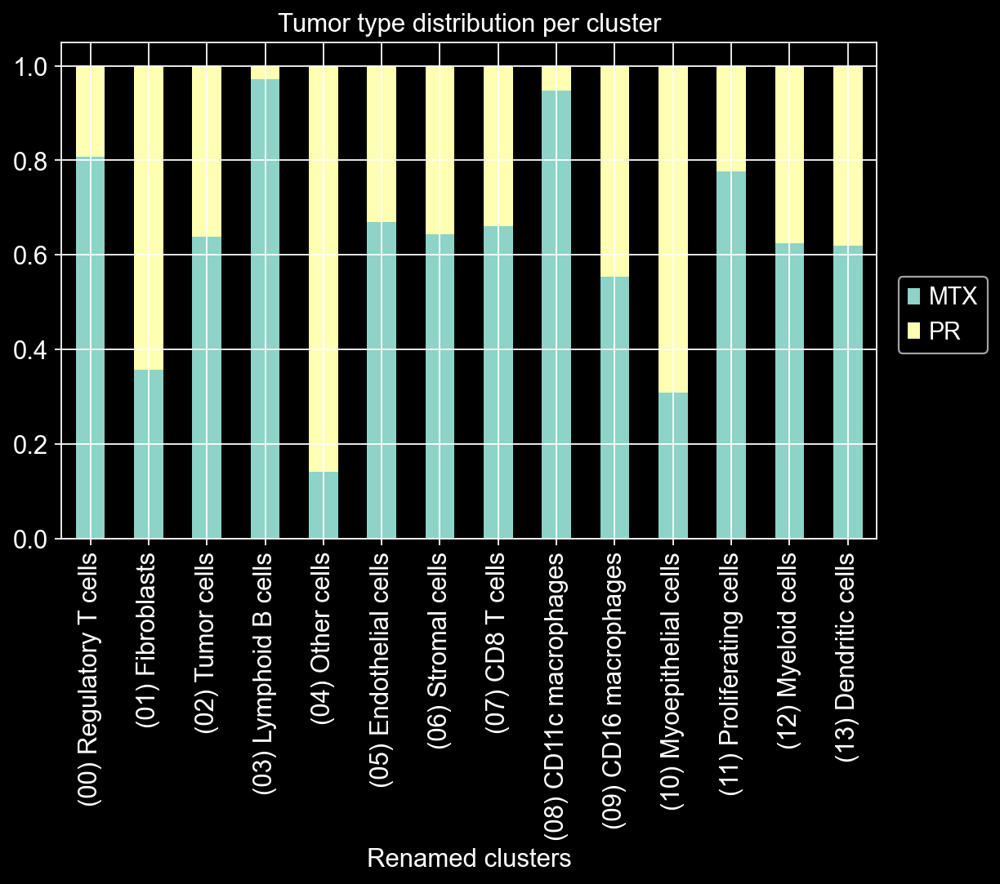

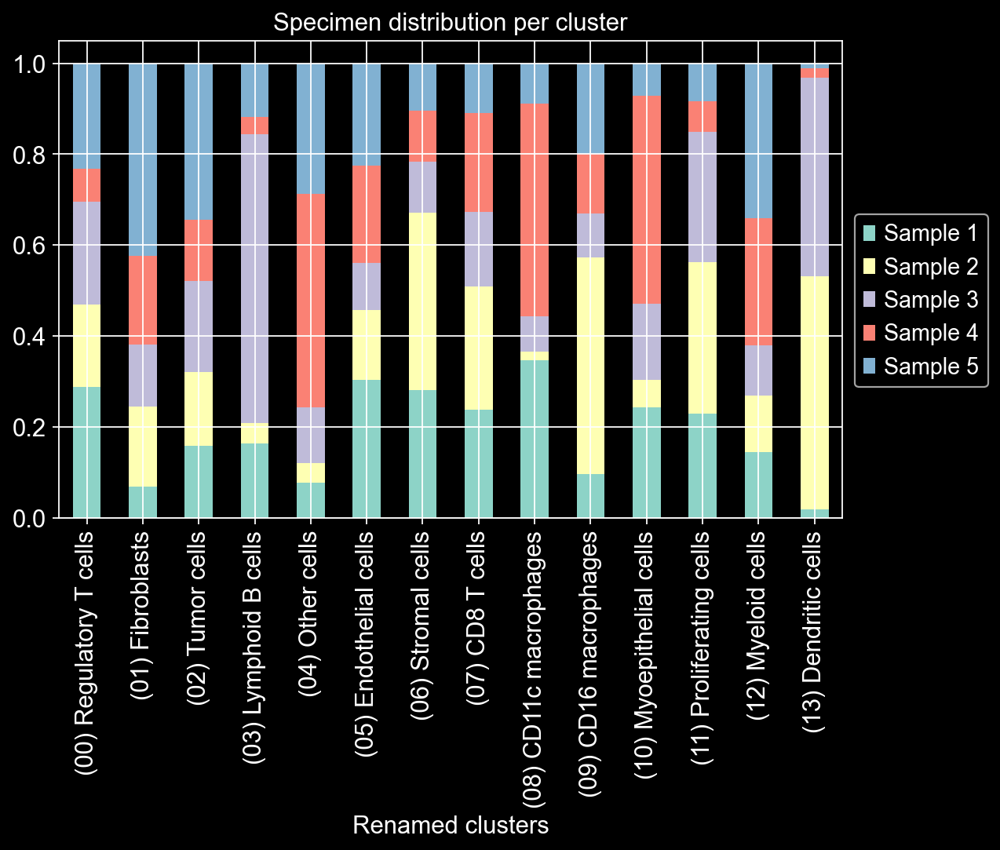

In [25]:
sc.set_figure_params(figsize='8,5')
plt.style.use('dark_background')
title_1 = 'Tumor type distribution per cluster'
title_2 = 'Specimen distribution per cluster'
tmp = pd.crosstab(adata_unsupervised_cleaned.obs['Renamed clusters'],adata_unsupervised_cleaned.obs['type'], normalize = 'index') 
tmp.plot.bar(stacked=True, title = title_1).legend(loc='lower right',bbox_to_anchor=(1.15, 0.35))

tmp = pd.crosstab(adata_unsupervised_cleaned.obs['Renamed clusters'],adata_unsupervised_cleaned.obs['samples'], normalize = 'index') 
tmp.plot.bar(stacked=True, title = title_2).legend(loc='lower right',bbox_to_anchor=(1.2, 0.25))

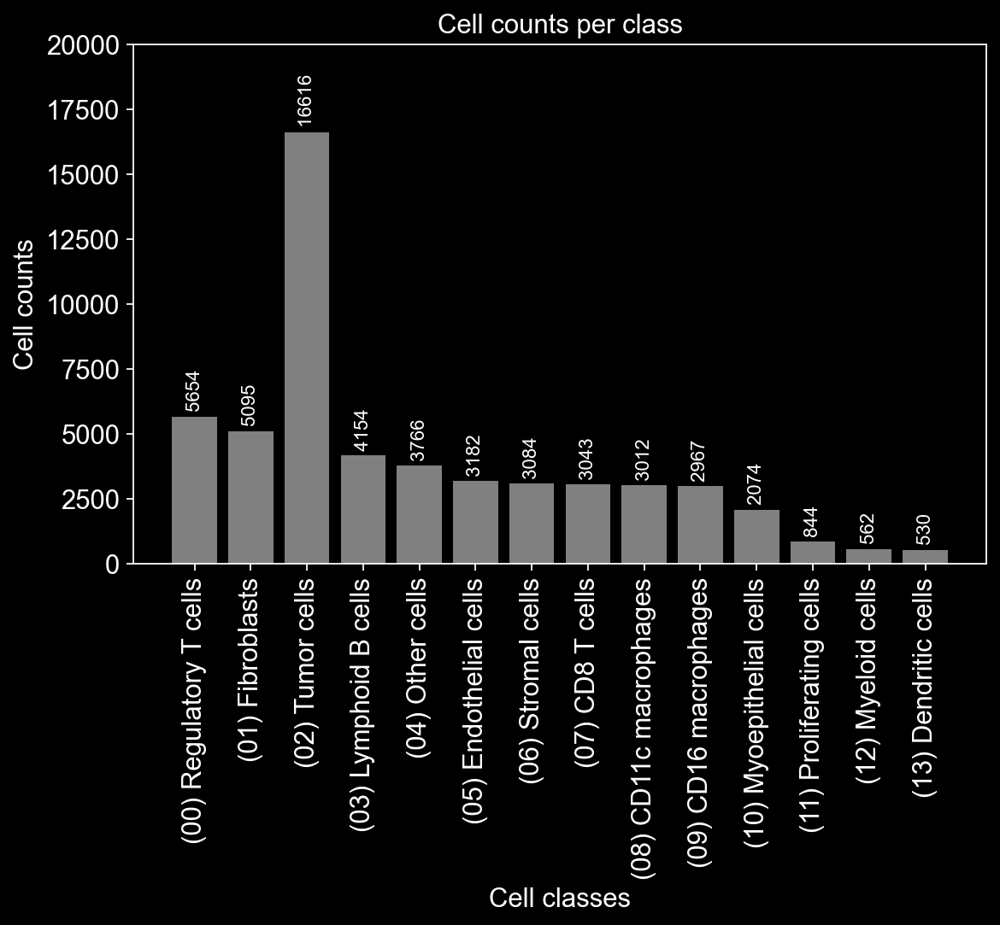

In [26]:
# Create a bar plot for counts
counts = adata_unsupervised_cleaned.obs['Renamed clusters'].value_counts().sort_index()
# Get data
categories = counts.index.to_numpy()
values = counts.to_numpy()
# Plot bar plot
fig, _ = plot_bar_chart(categories, values)
plt.show()

#### Plot clusters using spatial coordinates
First each TMA core needs to be recentered and then the corresponding scatterplots will be made

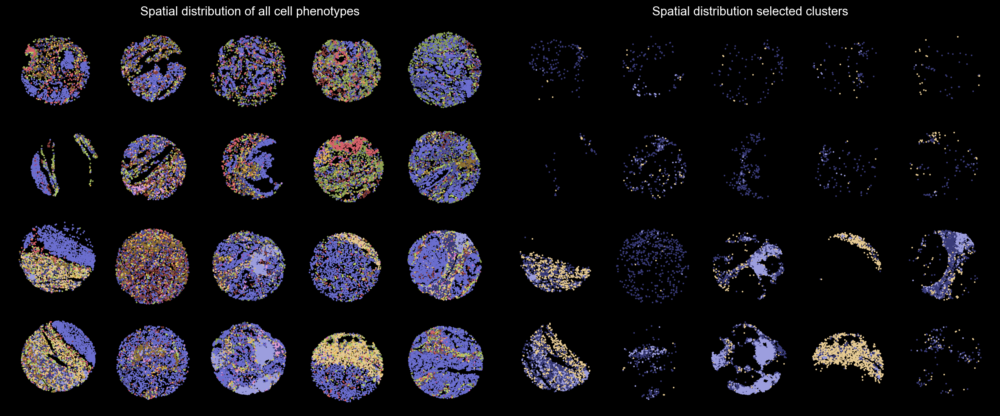

In [27]:
# Get X,Y coords recenter
X_coords_uns, Y_coords_uns = recenter_cores(adata_unsupervised_cleaned, core_names_arranged)

# Get class names as integers
clusters_uns = adata_unsupervised_cleaned.obs['Filtered clusters'].to_numpy(dtype = 'int')
cluster_mask = np.isin(clusters_uns, [0,3,10])

# Create a plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (16,8))

ax1.scatter(X_coords_uns, Y_coords_uns, c = clusters_uns, cmap = 'tab20b', s = 0.7, vmin=0, vmax=18)
ax2.scatter(X_coords_uns[cluster_mask], Y_coords_uns[cluster_mask], c = clusters_uns[cluster_mask], cmap = 'tab20b', s = 0.7, vmin=0, vmax=18)

ax1.set_ylim(500,-3500); ax2.set_ylim(500,-3500)
ax1.set_xlim(-500,4500); ax2.set_xlim(-500,4500)

ax1.set_aspect('equal'); ax2.set_aspect('equal')
ax1.axis('off'); ax2.axis('off')

ax1.set_title('Spatial distribution of all cell phenotypes')
ax2.set_title('Spatial distribution selected clusters')

plt.tight_layout()

### Make averaged cell images for specific class per each channel

In [28]:
try:
    # Make averaged images
    CK_av_image = make_averaged_crop(img_path=img_path,
                                    marker_name='PanCK',
                                    cluster_name='(02) Tumor cells',
                                    cluster_names=full_names,
                                    adata=adata_unsupervised_cleaned,
                                    img_px_size=px_size)

    CD3_av_image = make_averaged_crop(img_path=img_path,
                                    marker_name='CD3',
                                    cluster_name='(00) Regulatory T cells',
                                    cluster_names=full_names,
                                    adata=adata_unsupervised_cleaned,
                                    img_px_size=px_size)

    CD4_av_image = make_averaged_crop(img_path=img_path,  
                                    marker_name='CD4',
                                    cluster_name='(00) Regulatory T cells',
                                    cluster_names = full_names,
                                    adata=adata_unsupervised_cleaned,
                                    img_px_size=px_size)

    FoxP3_av_image = make_averaged_crop(img_path=img_path,
                                    marker_name='FoxP3',
                                    cluster_name='(00) Regulatory T cells',
                                    cluster_names = full_names,
                                    adata=adata_unsupervised_cleaned,
                                    img_px_size=px_size)
    
    # Plot all averaged images
    av_images = [CK_av_image, CD3_av_image, CD4_av_image, FoxP3_av_image]
    titles = ['PanCK', 'CD3', 'CD4', 'FoxP3']
    img_intensities = [[500, 15000], [2500, 5000], [2500, 5000],[1000, 4000]]

    # Create a figure with subplots
    fig, axs = plt.subplots(1, len(av_images), figsize=(15, 5))

     # Display each image with its title
    for ax, image, title, vmin_vmax in zip(axs, av_images, titles, img_intensities):
        im = ax.imshow(image, cmap='gray', vmin = vmin_vmax[0], vmax = vmin_vmax[1])  # Adjust the cmap based on your image type
        ax.set_title(title)
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', fraction=0.046, pad=0.04)  # Add color-bar
        ax.axis('off')  # Hide axes

    # Adjust layout and display the plot
    plt.tight_layout()
    fig.suptitle('Averaged marker images', fontsize = 20)
    plt.show()
except ValueError:
    print(f'Image in a specified path {img_path} was not found. Skipping this cell')

Image in a specified path data/TMA_downstream_analysis.ome.tiff was not found. Skipping this cell


# Spatial analysis (Figure 5)

Here the Squidpy package is going to be used to create Neighborhood enrichment and interaction matrices

In [29]:
#Copy adata object
adata_spatial =adata_unsupervised_cleaned.copy()

filt_MTX = adata_spatial[adata_spatial.obs['type'] == 'MTX']
filt_PR = adata_spatial[adata_spatial.obs['type'] == 'PR']

#Calculate neighbors
sq.gr.spatial_neighbors(filt_MTX, coord_type="generic")
sq.gr.nhood_enrichment(filt_MTX, cluster_key="Renamed clusters")

sq.gr.spatial_neighbors(filt_PR, coord_type="generic")
sq.gr.nhood_enrichment(filt_PR, cluster_key="Renamed clusters")

100%|████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:10<00:00, 96.41/s]


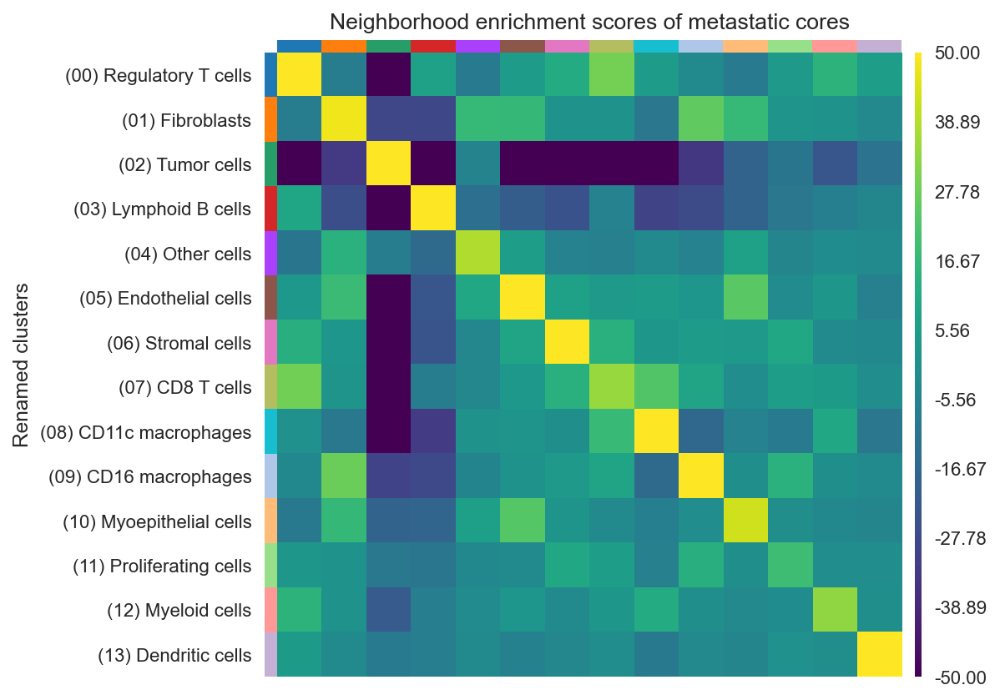

In [30]:
sc.set_figure_params()
plt.style.use('seaborn')
plot_title = 'Neighborhood enrichment scores of metastatic cores'
sq.pl.nhood_enrichment(filt_MTX, figsize = (5,5), title = plot_title, cluster_key="Renamed clusters", cmap = 'viridis', mode = 'zscore', vmin=-50, vmax=50) 

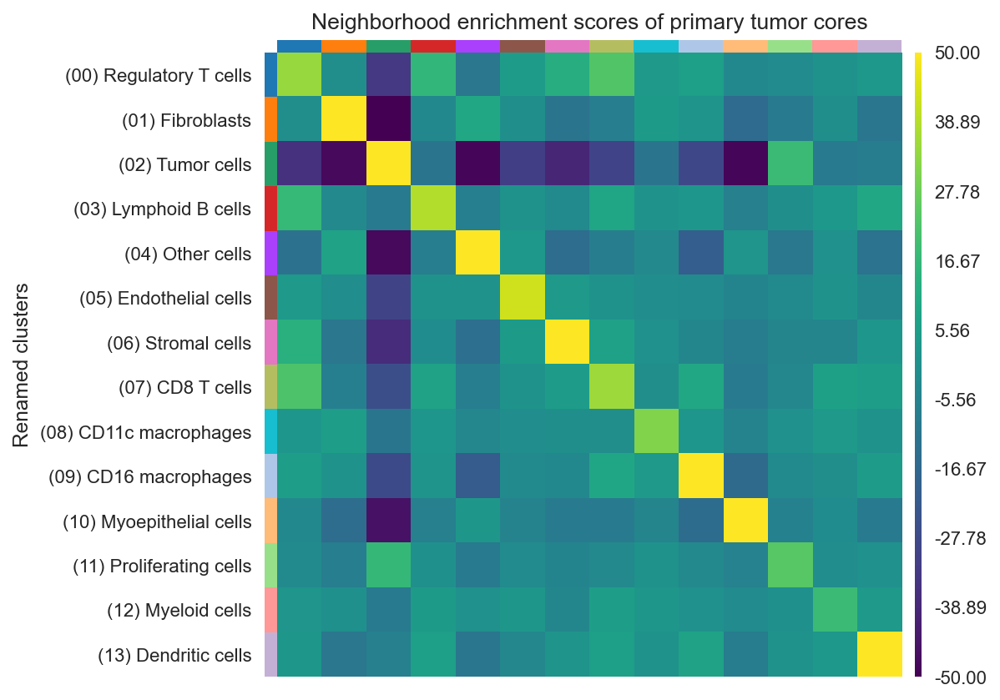

In [31]:
sc.set_figure_params()
plt.style.use('seaborn')
plot_title = 'Neighborhood enrichment scores of primary tumor cores'
sq.pl.nhood_enrichment(filt_PR, title = plot_title, figsize = (5,5), cluster_key="Renamed clusters", cmap = 'viridis', mode = 'zscore', vmin=-50, vmax=50)

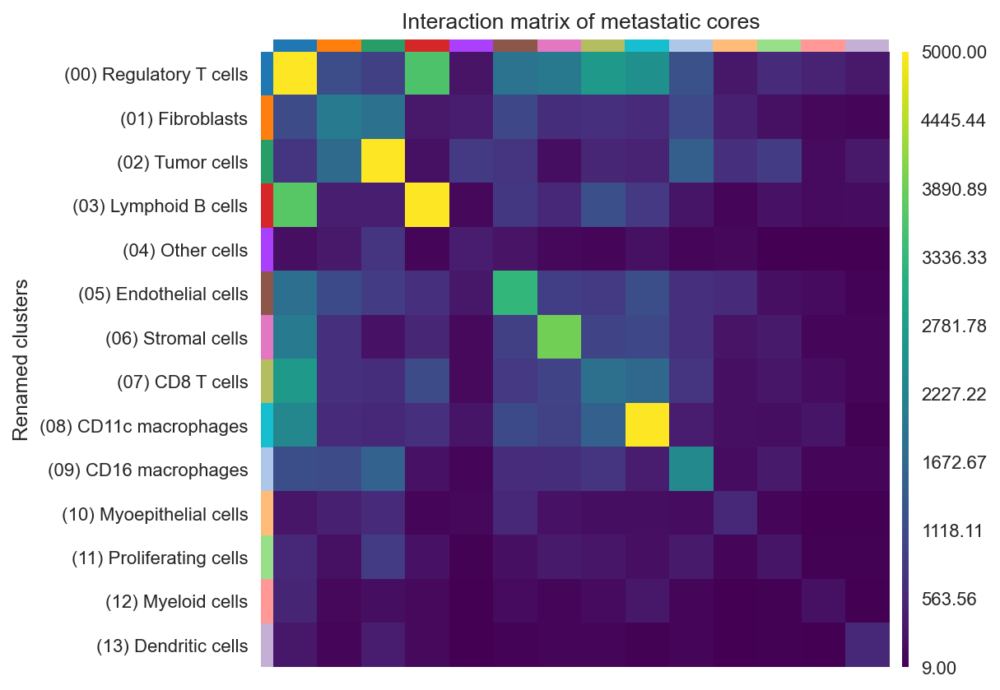

In [32]:
sc.set_figure_params()
plt.style.use('seaborn')
plot_title = 'Interaction matrix of metastatic cores'
sq.gr.interaction_matrix(filt_MTX, cluster_key="Renamed clusters")
sq.pl.interaction_matrix(filt_MTX, title = plot_title, figsize = (5,5), cluster_key="Renamed clusters", mode = 'zscore', vmax=5000) 

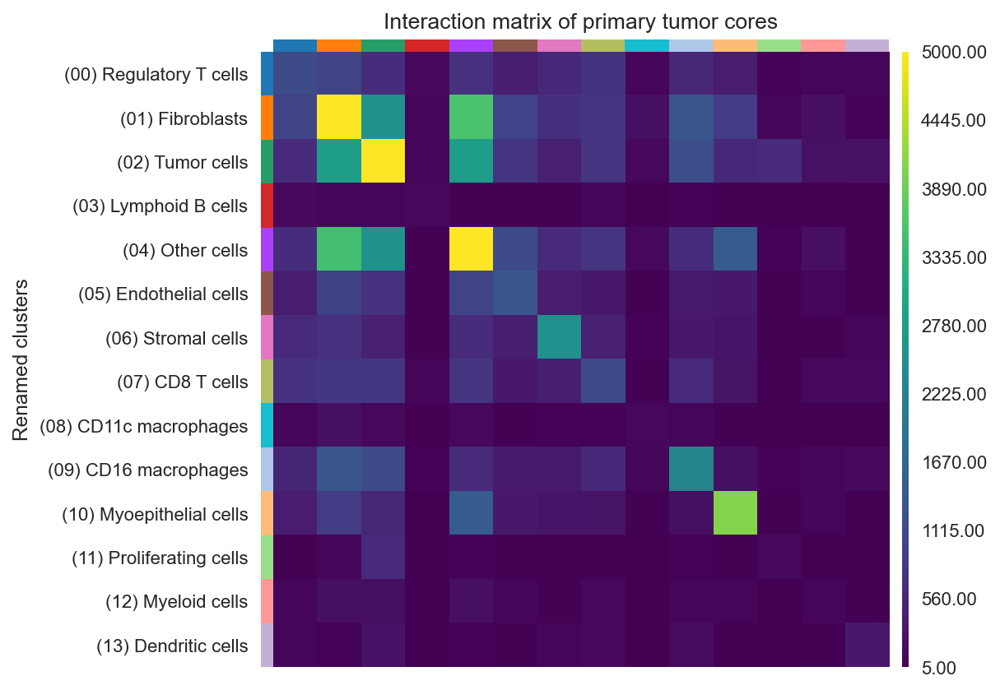

In [33]:
sc.set_figure_params()
plt.style.use('seaborn')
plot_title = 'Interaction matrix of primary tumor cores'
sq.gr.interaction_matrix(filt_PR, cluster_key="Renamed clusters")
sq.pl.interaction_matrix(filt_PR, title = plot_title, figsize = (5,5), cluster_key="Renamed clusters", mode = 'zscore', vmax=5000) 

## Co-occurrence scores

#### Calculate co-occurrence scores per core and then average the matching ones
* 1) Filter based on metastatic and primary CORES
* 2) Calculate co-ocurrence scores
* 3) Average scores from each core

In [34]:
coo_intervals = np.arange(0,430,30)

MTX_coo_matrix = get_average_co_occurrence_matrix(filt_MTX,
                                                 coo_intervals,
                                                 cluster_obs_key='Renamed clusters',
                                                 cores_obs_key='cores')
PR_coo_matrix = get_average_co_occurrence_matrix(filt_PR,
                                                 coo_intervals,
                                                 cluster_obs_key='Renamed clusters',
                                                 cores_obs_key='cores')

100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.85it/s]


#### Plot co-occurrence scores of interest

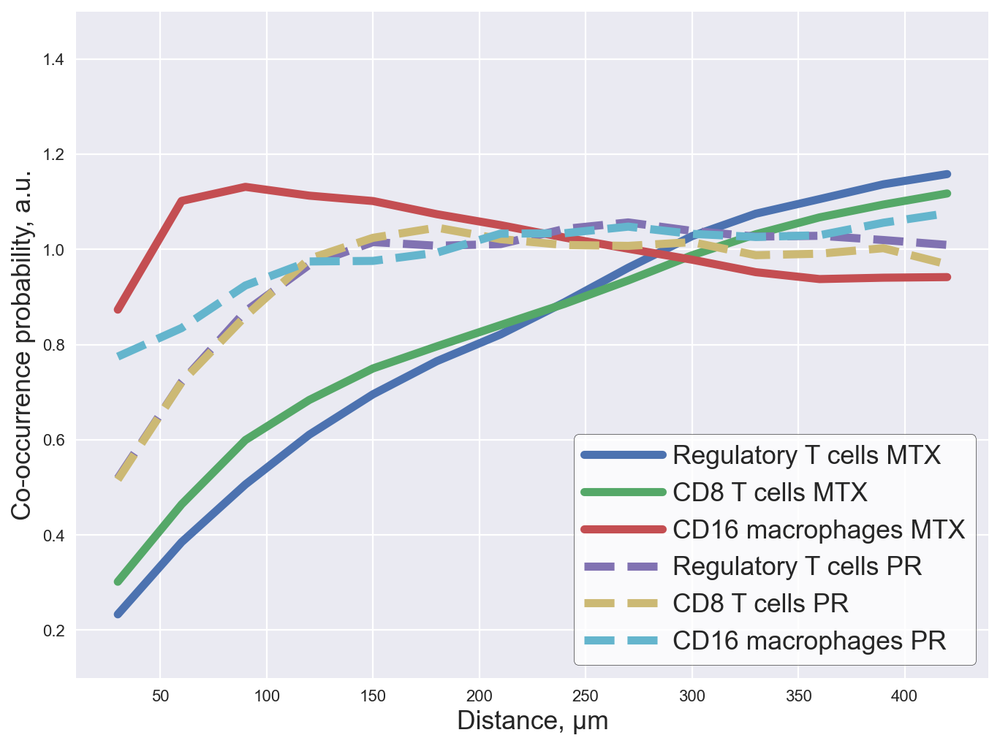

In [35]:
# Plot average co-occurrence scores
clust_CK = 2 # (02) Tumor cells
clust_T_reg = 0 # (00) Regulatory T cells
clust_CD16 = 9 # (09) CD16 macrophages
clust_CD8T = 7 # (07) CD8 T cells

index_to_cluster_name = {
    2: "Tumor cells",
    0: "Regulatory T cells",
    9: "CD16 macrophages",
    7: "CD8 T cells"
}

interval_crop = coo_intervals[0:-1]

fig = plt.figure(figsize = (10,7.5))
for s, subcluster in enumerate(MTX_coo_matrix[clust_CK]):
    if s == clust_CK:
        pass
    elif s == clust_CD16 or s == clust_T_reg or s == clust_CD8T:
        plt.plot(interval_crop+30, subcluster, label = str(index_to_cluster_name[s]) + ' MTX', lw = 5)
plt.legend(loc="upper center", mode = "expand", ncol = 10)


for s, subcluster in enumerate(PR_coo_matrix[clust_CK]):
    if s == clust_CK:
        pass
    elif s == clust_CD16 or s == clust_T_reg or s == clust_CD8T:
        plt.plot(interval_crop+30, subcluster, label = str(index_to_cluster_name[s])+' PR', lw = 5, linestyle = '--')

plt.legend(loc="lower right", handlelength = 3, fontsize = 16, frameon=True, facecolor='white', edgecolor='black')
plt.xlabel('Distance, \u00b5m', fontsize = 16)
plt.ylabel('Co-occurrence probability, a.u.', fontsize = 16)
plt.ylim(0.1, 1.5)
plt.show()